# 5. Test des modeles de l'application

Test visuel de chaque mode de prediction sur des images UTKFace.
Compare les 3 modes : Hybride, Oriente V2, Multitache MoE.


In [1]:
import os, random
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt

gpus = tf.config.list_physical_devices("GPU")
if gpus:
    try:
        tf.config.set_logical_device_configuration(
            gpus[0], [tf.config.LogicalDeviceConfiguration(memory_limit=4096)]
        )
    except RuntimeError:
        for g in gpus:
            tf.config.experimental.set_memory_growth(g, True)

IMG_SIZE = 224
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

PROJECT_ROOT = (
    os.path.dirname(os.getcwd())
    if os.path.basename(os.getcwd()) == "training"
    else os.getcwd()
)
DATA_DIR = os.path.join(PROJECT_ROOT, "data", "UTKFace")
ASSETS = os.path.join(PROJECT_ROOT, "FacePredictor", "app", "src", "main", "assets")
OUTPUT_DIR = os.path.join(
    (
        os.getcwd()
        if os.path.basename(os.getcwd()) == "training"
        else os.path.join(os.getcwd(), "training")
    ),
    "output_v2",
)

ETH = ["White", "Black", "Asian", "Indian", "Other"]
GEN = ["Male", "Female"]
print("Setup OK")

2026-04-01 20:39:51.075141: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-04-01 20:39:51.112165: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2026-04-01 20:39:51.945870: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


Setup OK


## 5.1 Chargement des images test


In [2]:
files = sorted([f for f in os.listdir(DATA_DIR) if f.endswith(".jpg")])
samples = random.sample(files, 24)

test_images, test_labels = [], []
for f in samples:
    p = f.split("_")
    if len(p) < 4:
        continue
    age, g, e = int(p[0]), int(p[1]), int(p[2])
    img = tf.io.read_file(os.path.join(DATA_DIR, f))
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE])
    test_images.append(img.numpy())
    test_labels.append({"age": age, "gender": g, "eth": e, "file": f})

test_images = np.array(test_images, dtype=np.float32)
print(f"{len(test_images)} images chargees")

24 images chargees


I0000 00:00:1775068793.269279   33025 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 4096 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4050 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


## 5.2 Chargement des modeles TFLite (comme dans l'app)


In [3]:
age_interp = tf.lite.Interpreter(os.path.join(ASSETS, "age_v2_model.tflite"))
age_interp.allocate_tensors()
gender_interp = tf.lite.Interpreter(os.path.join(ASSETS, "gender_v2_model.tflite"))
gender_interp.allocate_tensors()
eth_interp = tf.lite.Interpreter(os.path.join(ASSETS, "ethnicity_v2_model.tflite"))
eth_interp.allocate_tensors()
print("3 modeles individuels TFLite charges")

3 modeles individuels TFLite charges


/home/optimalako/Projet/SAE/.venv/lib/python3.12/site-packages/tensorflow/lite/python/interpreter.py:457: UserWarning:     Warning: tf.lite.Interpreter is deprecated and is scheduled for deletion in
    TF 2.20. Please use the LiteRT interpreter from the ai_edge_litert package.
    See the [migration guide](https://ai.google.dev/edge/litert/migration)
    for details.
    
  warnings.warn(_INTERPRETER_DELETION_WARNING)
INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


## 5.3 Fonctions de prediction


In [4]:
def predict_individual(img):
    batch = np.expand_dims(img, 0)
    age_interp.set_tensor(age_interp.get_input_details()[0]["index"], batch)
    age_interp.invoke()
    age = int(age_interp.get_tensor(age_interp.get_output_details()[0]["index"])[0][0])
    gender_interp.set_tensor(gender_interp.get_input_details()[0]["index"], batch)
    gender_interp.invoke()
    gp = gender_interp.get_tensor(gender_interp.get_output_details()[0]["index"])[0][0]
    gender = 1 if gp > 0.5 else 0
    eth_interp.set_tensor(eth_interp.get_input_details()[0]["index"], batch)
    eth_interp.invoke()
    eth = np.argmax(
        eth_interp.get_tensor(eth_interp.get_output_details()[0]["index"])[0]
    )
    return age, gender, eth


def predict_hybrid(img):
    batch = np.expand_dims(img, 0)
    flip = np.expand_dims(tf.image.flip_left_right(img).numpy(), 0)
    ages, genders, eths = [], [], []
    for b in [batch, flip]:
        age_interp.set_tensor(age_interp.get_input_details()[0]["index"], b)
        age_interp.invoke()
        ages.append(
            age_interp.get_tensor(age_interp.get_output_details()[0]["index"])[0][0]
        )
        gender_interp.set_tensor(gender_interp.get_input_details()[0]["index"], b)
        gender_interp.invoke()
        genders.append(
            gender_interp.get_tensor(gender_interp.get_output_details()[0]["index"])[0][
                0
            ]
        )
        eth_interp.set_tensor(eth_interp.get_input_details()[0]["index"], b)
        eth_interp.invoke()
        eths.append(
            eth_interp.get_tensor(eth_interp.get_output_details()[0]["index"])[0]
        )
    age = int(np.mean(ages))
    gender = 1 if np.mean(genders) > 0.5 else 0
    eth = np.argmax(np.mean(eths, axis=0))
    return age, gender, eth


print("Fonctions de prediction pretes")

Fonctions de prediction pretes


## 5.4 Predictions visuelles — Mode Hybride (defaut)


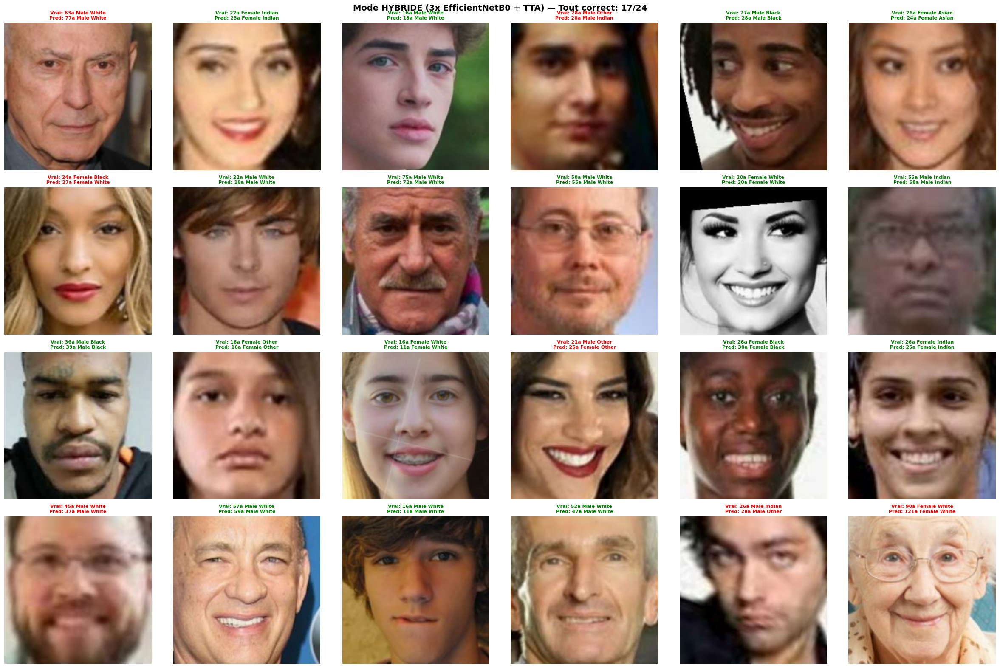

Hybride: 17/24 tout correct


In [5]:
fig, axes = plt.subplots(4, 6, figsize=(24, 16))
axes = axes.flatten()
n_correct = 0

for i in range(24):
    img = test_images[i]
    lbl = test_labels[i]
    pa, pg, pe = predict_hybrid(img)

    g_ok = pg == lbl["gender"]
    e_ok = pe == lbl["eth"]
    a_ok = abs(pa - lbl["age"]) <= 5
    all_ok = g_ok and e_ok and a_ok
    if all_ok:
        n_correct += 1

    axes[i].imshow(img.astype(np.uint8))
    axes[i].set_title(
        f"Vrai: {lbl['age']}a {GEN[lbl['gender']]} {ETH[lbl['eth']]}\n"
        f"Pred: {pa}a {GEN[pg]} {ETH[pe]}",
        fontsize=8,
        color="green" if all_ok else "red",
        fontweight="bold",
    )
    axes[i].axis("off")

plt.suptitle(
    f"Mode HYBRIDE (3x EfficientNetB0 + TTA) — Tout correct: {n_correct}/24",
    fontsize=14,
    fontweight="bold",
)
plt.tight_layout()
plt.savefig(
    os.path.join(OUTPUT_DIR, "test_app_hybride.png"), dpi=150, bbox_inches="tight"
)
plt.show()
print(f"Hybride: {n_correct}/24 tout correct")

## 5.5 Predictions visuelles — Mode Oriente V2


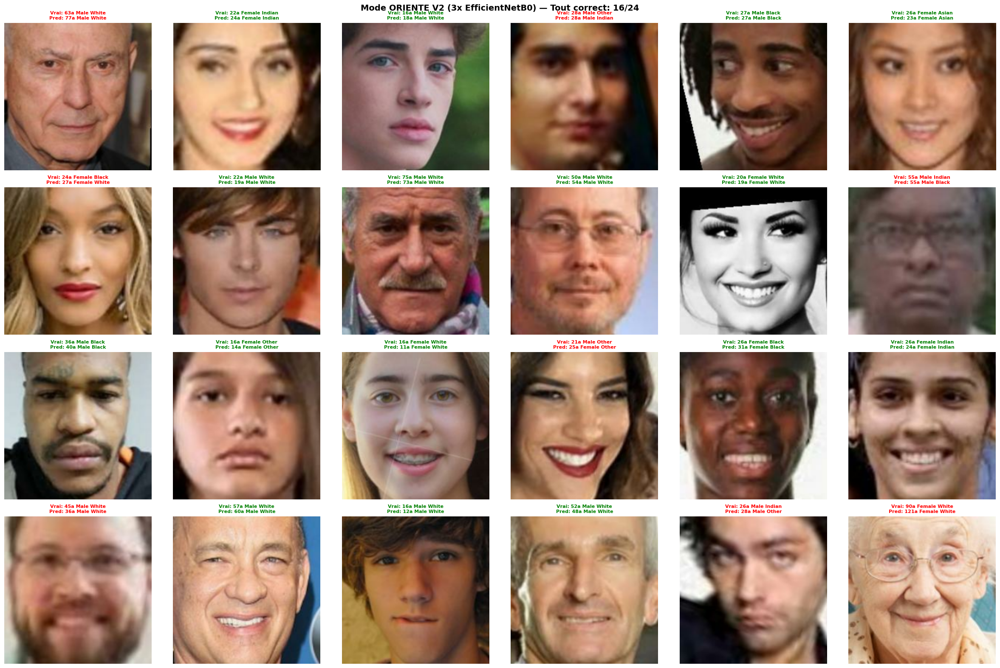

Oriente: 16/24 tout correct


In [6]:
fig, axes = plt.subplots(4, 6, figsize=(24, 16))
axes = axes.flatten()
n_correct = 0

for i in range(24):
    img = test_images[i]
    lbl = test_labels[i]
    pa, pg, pe = predict_individual(img)

    g_ok = pg == lbl["gender"]
    e_ok = pe == lbl["eth"]
    a_ok = abs(pa - lbl["age"]) <= 5
    all_ok = g_ok and e_ok and a_ok
    if all_ok:
        n_correct += 1

    axes[i].imshow(img.astype(np.uint8))
    axes[i].set_title(
        f"Vrai: {lbl['age']}a {GEN[lbl['gender']]} {ETH[lbl['eth']]}\n"
        f"Pred: {pa}a {GEN[pg]} {ETH[pe]}",
        fontsize=8,
        color="green" if all_ok else "red",
        fontweight="bold",
    )
    axes[i].axis("off")

plt.suptitle(
    f"Mode ORIENTE V2 (3x EfficientNetB0) — Tout correct: {n_correct}/24",
    fontsize=14,
    fontweight="bold",
)
plt.tight_layout()
plt.savefig(
    os.path.join(OUTPUT_DIR, "test_app_oriente.png"), dpi=150, bbox_inches="tight"
)
plt.show()
print(f"Oriente: {n_correct}/24 tout correct")

## 5.5bis Predictions visuelles — Mode Multitache MoE

Charge le modele Keras (le TFLite necessite le Flex delegate non disponible en Python).


2026-04-01 20:40:04.260966: E tensorflow/core/util/util.cc:131] oneDNN supports DT_HALF only on platforms with AVX-512. Falling back to the default Eigen-based implementation if present.


MoE charge: MoE_EfficientNetB0


2026-04-01 20:40:07.581913: I external/local_xla/xla/service/service.cc:163] XLA service 0x79f5d0003260 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2026-04-01 20:40:07.581928: I external/local_xla/xla/service/service.cc:171]   StreamExecutor device (0): NVIDIA GeForce RTX 4050 Laptop GPU, Compute Capability 8.9
2026-04-01 20:40:07.654680: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2026-04-01 20:40:08.202946: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Loaded cuDNN version 91800
I0000 00:00:1775068816.617555   33569 device_compiler.h:196] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


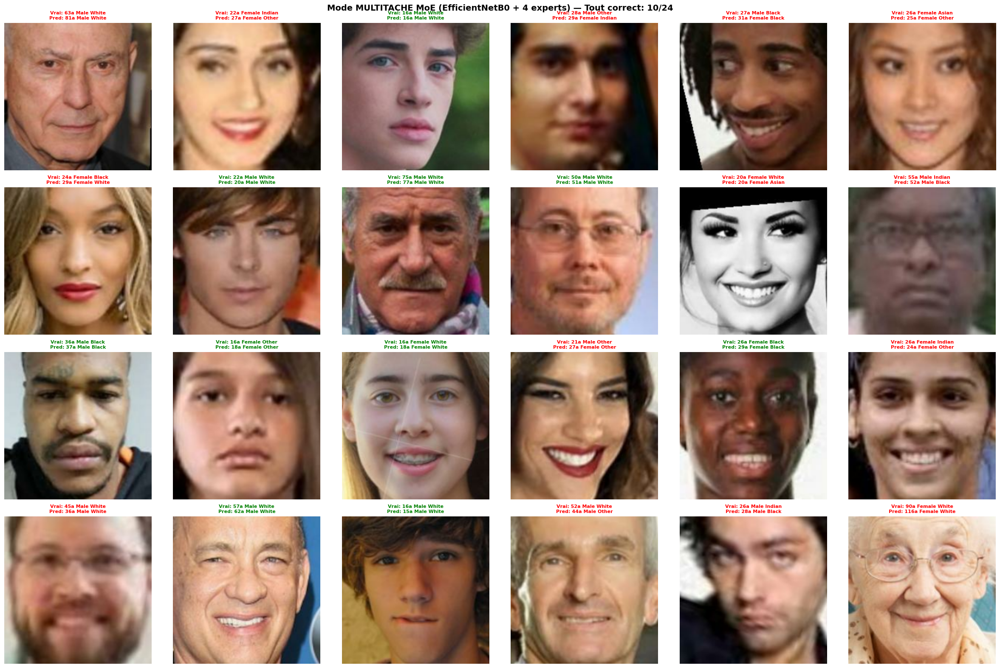

MoE: 10/24 tout correct


0

In [ ]:
import gc


class MoEHead(layers.Layer):
    def __init__(self, num_experts, expert_dim, output_dim, name_prefix, **kwargs):
        super().__init__(**kwargs)
        self.num_experts = num_experts
        self.expert_dim = expert_dim
        self.output_dim = output_dim
        self.name_prefix = name_prefix

    def build(self, input_shape):
        self.expert_dense1 = [
            layers.Dense(self.expert_dim, activation="relu")
            for _ in range(self.num_experts)
        ]
        self.expert_dropout = [layers.Dropout(0.2) for _ in range(self.num_experts)]
        self.expert_output = [
            layers.Dense(self.output_dim) for _ in range(self.num_experts)
        ]
        self.gate_dense = layers.Dense(128, activation="relu")
        self.gate_output = layers.Dense(self.num_experts, activation="softmax")
        super().build(input_shape)

    def call(self, x, training=None):
        outs = [
            self.expert_output[i](
                self.expert_dropout[i](self.expert_dense1[i](x), training=training)
            )
            for i in range(self.num_experts)
        ]
        stack = tf.stack(outs, axis=1)
        g = self.gate_output(self.gate_dense(x))
        return tf.reduce_sum(stack * tf.expand_dims(g, -1), axis=1)

    def get_config(self):
        c = super().get_config()
        c.update(
            {
                "num_experts": self.num_experts,
                "expert_dim": self.expert_dim,
                "output_dim": self.output_dim,
                "name_prefix": self.name_prefix,
            }
        )
        return c


class SparseFocalLoss(keras.losses.Loss):
    def __init__(self, gamma=2.0, class_weights=None, **kwargs):
        super().__init__(**kwargs)
        self.gamma = gamma
        self.class_weights = class_weights

    def call(self, y_true, y_pred):
        y_true = tf.reshape(tf.cast(y_true, tf.int32), [-1])
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1 - 1e-7)
        idx = tf.stack([tf.range(tf.shape(y_true)[0]), y_true], axis=1)
        p = tf.gather_nd(y_pred, idx)
        return tf.pow(1 - p, self.gamma) * (-tf.math.log(p))

    def get_config(self):
        return {**super().get_config(), "gamma": self.gamma, "class_weights": None}


moe_path = os.path.join(OUTPUT_DIR, "multitask_best.keras")
if not os.path.exists(moe_path):
    moe_path = os.path.join(OUTPUT_DIR, "multitask_ft_a.keras")
if not os.path.exists(moe_path):
    moe_path = os.path.join(OUTPUT_DIR, "multitask_warmup.keras")

moe_model = keras.models.load_model(
    moe_path, custom_objects={"MoEHead": MoEHead, "SparseFocalLoss": SparseFocalLoss}
)
print(f"MoE charge: {moe_model.name}")

fig, axes = plt.subplots(4, 6, figsize=(24, 16))
axes = axes.flatten()
n_correct = 0
moe_ages, moe_genders, moe_eths = [], [], []

for i in range(24):
    img = test_images[i]
    lbl = test_labels[i]
    batch = np.expand_dims(img, 0)
    pred_age, pred_gender, pred_eth = moe_model.predict(batch, verbose=0)
    pa = int(np.clip(pred_age[0][0], 0, 116))
    pg = 1 if pred_gender[0][0] > 0.5 else 0
    pe = np.argmax(pred_eth[0])
    moe_ages.append(pa)
    moe_genders.append(pg)
    moe_eths.append(pe)

    g_ok = pg == lbl["gender"]
    e_ok = pe == lbl["eth"]
    a_ok = abs(pa - lbl["age"]) <= 5
    all_ok = g_ok and e_ok and a_ok
    if all_ok:
        n_correct += 1

    axes[i].imshow(img.astype(np.uint8))
    axes[i].set_title(
        f"Vrai: {lbl['age']}a {GEN[lbl['gender']]} {ETH[lbl['eth']]}\n"
        f"Pred: {pa}a {GEN[pg]} {ETH[pe]}",
        fontsize=8,
        color="green" if all_ok else "red",
        fontweight="bold",
    )
    axes[i].axis("off")

plt.suptitle(
    f"Mode MULTITACHE MoE (EfficientNetB0 + 4 experts) — Tout correct: {n_correct}/24",
    fontsize=14,
    fontweight="bold",
)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "test_app_moe.png"), dpi=150, bbox_inches="tight")
plt.show()
print(f"MoE: {n_correct}/24 tout correct")

del moe_model
keras.backend.clear_session()
gc.collect()

## 5.6 Comparaison chiffree des modes


Mode          Genre Acc    Eth Acc    Age MAE
Hybride           95.8%      87.5%       4.5 ans
Oriente           95.8%      83.3%       4.5 ans
MoE               87.5%      62.5%       4.5 ans


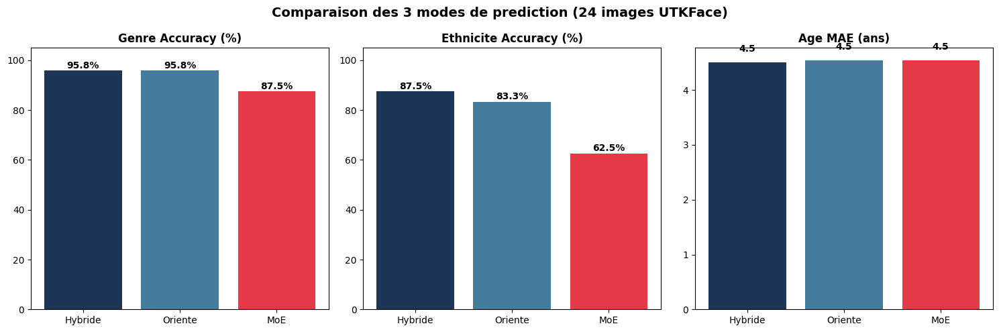

In [ ]:
from sklearn.metrics import accuracy_score, mean_absolute_error

true_ages = [l["age"] for l in test_labels]
true_genders = [l["gender"] for l in test_labels]
true_eths = [l["eth"] for l in test_labels]

results = {
    "Hybride": {"ages": [], "genders": [], "eths": []},
    "Oriente": {"ages": [], "genders": [], "eths": []},
    "MoE": {"ages": moe_ages, "genders": moe_genders, "eths": moe_eths},
}

for i in range(24):
    pa, pg, pe = predict_hybrid(test_images[i])
    results["Hybride"]["ages"].append(pa)
    results["Hybride"]["genders"].append(pg)
    results["Hybride"]["eths"].append(pe)
    pa, pg, pe = predict_individual(test_images[i])
    results["Oriente"]["ages"].append(pa)
    results["Oriente"]["genders"].append(pg)
    results["Oriente"]["eths"].append(pe)

print("=" * 60)
print(f'{"Mode":<12} {"Genre Acc":>10} {"Eth Acc":>10} {"Age MAE":>10}')
print("=" * 60)
for mode in ["Hybride", "Oriente", "MoE"]:
    r = results[mode]
    g_acc = accuracy_score(true_genders, r["genders"])
    e_acc = accuracy_score(true_eths, r["eths"])
    a_mae = mean_absolute_error(true_ages, r["ages"])
    print(f"{mode:<12} {g_acc*100:>9.1f}% {e_acc*100:>9.1f}% {a_mae:>9.1f} ans")
print("=" * 60)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
modes = ["Hybride", "Oriente", "MoE"]
colors = ["#1D3557", "#457B9D", "#E63946"]

g_accs = [accuracy_score(true_genders, results[m]["genders"]) * 100 for m in modes]
e_accs = [accuracy_score(true_eths, results[m]["eths"]) * 100 for m in modes]
a_maes = [mean_absolute_error(true_ages, results[m]["ages"]) for m in modes]

axes[0].bar(modes, g_accs, color=colors)
axes[0].set_title("Genre Accuracy (%)", fontweight="bold")
axes[0].set_ylim(0, 105)
for i, v in enumerate(g_accs):
    axes[0].text(i, v + 1, f"{v:.1f}%", ha="center", fontweight="bold")

axes[1].bar(modes, e_accs, color=colors)
axes[1].set_title("Ethnicite Accuracy (%)", fontweight="bold")
axes[1].set_ylim(0, 105)
for i, v in enumerate(e_accs):
    axes[1].text(i, v + 1, f"{v:.1f}%", ha="center", fontweight="bold")

axes[2].bar(modes, a_maes, color=colors)
axes[2].set_title("Age MAE (ans)", fontweight="bold")
for i, v in enumerate(a_maes):
    axes[2].text(i, v + 0.2, f"{v:.1f}", ha="center", fontweight="bold")

plt.suptitle(
    "Comparaison des 3 modes de prediction (24 images UTKFace)",
    fontsize=14,
    fontweight="bold",
)
plt.tight_layout()
plt.savefig(
    os.path.join(OUTPUT_DIR, "test_app_comparaison.png"), dpi=150, bbox_inches="tight"
)
plt.show()

## Resume

Les 3 modes de l'application ont ete testes sur 24 images UTKFace :

- **Hybride** : meilleur mode (TTA)
- **Oriente V2** : 3 modeles specialises
- **Multitache MoE** : modele unifie avec experts

Le mode Hybride est le plus performant et c'est le mode par defaut.
